In [1]:
import numpy as np
import pandas as pd
import os
from shutil import copyfile
import pickle
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import colorlover as cl


import neuro_morpho_toolbox as nmt
%matplotlib inline
import pickle
pickle_in = open("/home/penglab/FeaCal/all_ns.pickle","rb")
[ns] = pickle.load(pickle_in)


/home/penglab/anaconda3/lib/python3.7/site-packages/neuro_morpho_toolbox-0.1-py3.7.egg/neuro_morpho_toolbox/
Loading CCF Atlas data...
Loading time: 0.85
Loading CCF brain structure data...
Loading time: 0.00


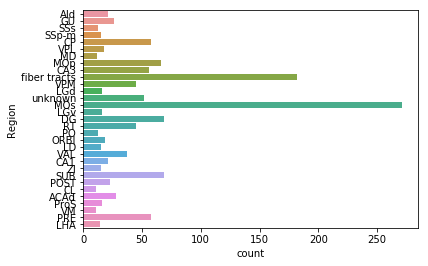

In [2]:
sf = ns.features['soma_features'].region
ct = sf["Region"].value_counts().sort_values(ascending=False)
_ = sns.countplot(y="Region", 
                  data=sf.loc[sf.Region.isin(ct.index[ct>10])],
                 )

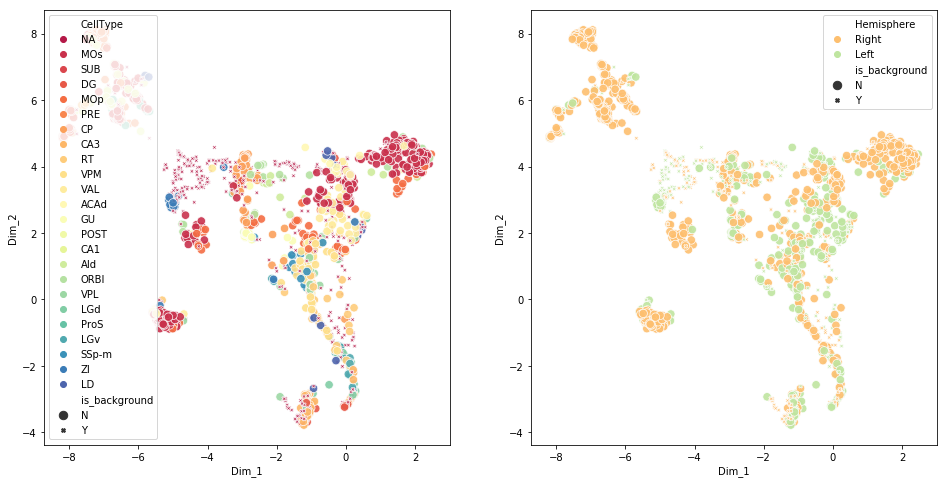

In [3]:
_ = ns.ReduceDimUMAP(feature_set="projection_features", n_neighbors=100)
_ = ns.FeatureScatter(["CellType", "Hemisphere"], map="UMAP")

## Convexhull
* By using hull=Convexhull(pts)
* hull.points is the input array
* hull.vertices is the index for points forming the vertices of the convex hull. For 3-D convex hulls, the vertices are in input order.


Therefore we cannot use convexHull to extract the region boundary

In [ ]:
nmt.annotation.array[528,0,0]

In [16]:
for i in range(10,15):
    for j in range(20,25):
        for k in range(30,35):
            if k !=34:
                continue
            for ii in range (100,103):
                print(i)
                print(j)
                print(k)
                print(ii)
                print('**')

10
20
34
100
**
10
20
34
101
**
10
20
34
102
**
10
21
34
100
**
10
21
34
101
**
10
21
34
102
**
10
22
34
100
**
10
22
34
101
**
10
22
34
102
**
10
23
34
100
**
10
23
34
101
**
10
23
34
102
**
10
24
34
100
**
10
24
34
101
**
10
24
34
102
**
11
20
34
100
**
11
20
34
101
**
11
20
34
102
**
11
21
34
100
**
11
21
34
101
**
11
21
34
102
**
11
22
34
100
**
11
22
34
101
**
11
22
34
102
**
11
23
34
100
**
11
23
34
101
**
11
23
34
102
**
11
24
34
100
**
11
24
34
101
**
11
24
34
102
**
12
20
34
100
**
12
20
34
101
**
12
20
34
102
**
12
21
34
100
**
12
21
34
101
**
12
21
34
102
**
12
22
34
100
**
12
22
34
101
**
12
22
34
102
**
12
23
34
100
**
12
23
34
101
**
12
23
34
102
**
12
24
34
100
**
12
24
34
101
**
12
24
34
102
**
13
20
34
100
**
13
20
34
101
**
13
20
34
102
**
13
21
34
100
**
13
21
34
101
**
13
21
34
102
**
13
22
34
100
**
13
22
34
101
**
13
22
34
102
**
13
23
34
100
**
13
23
34
101
**
13
23
34
102
**
13
24
34
100
**
13
24
34
101
**
13
24
34
102
**
14
20
34
100
**
14
20
34
101
**
14
20
34

In [ ]:
### Using 8-direction neighbor point to generate the vertices

from scipy.spatial import ConvexHull
from scipy.spatial import distance
#### DataFrame regionINFO includes ['index,'Vol','abbr']
regionN, count = np.unique(nmt.annotation.array, return_counts=True)
regionINFO = pd.DataFrame(index = list(regionN))
regionINFO['index'] = list(regionN)
regionINFO['Vol'] =  count
regionINFO.loc[:,'Vertices'] = 'unknown'
regionINFO['Vertices'].astype('object',inplace=True)
for iterI in regionINFO.index.tolist():
    if iterI in nmt.bs.level.index.tolist():
        regionINFO.loc[iterI,'abbr'] = nmt.bs.level.loc[iterI,'Abbrevation']
procI=0
regionINFO=regionINFO.astype(object) 
for iterIDX in regionINFO.index.tolist():
    procI=procI+1
    coordi=[]
    co_1,co_2,co_3 = np.where(nmt.annotation.array==iterIDX )
    co_1 = co_1[co_3<=nmt.annotation.size['z']//2]
    co_2 = co_2[co_3<=nmt.annotation.size['z']//2]
    co_3 = co_3[co_3<=nmt.annotation.size['z']//2]
    ls_other= []
    ls_x = []
    ls_y = []
    ls_z = []
    for x,y,z in zip(co_1,co_2,co_3):
        for i in range(-1,2):
            for j in range(-1,2):
                for k in range(-1,2):
                    if (x+i) >= nmt.annotation.array.shape[0] or (x+i) <0:
                        continue
                    if (y+j) >= nmt.annotation.array.shape[1] or (y+j) <0:
                        continue
                    if (z+k) >= nmt.annotation.array.shape[2] or (z+k) <0: 
                        continue                    
                    if nmt.annotation.array[x+i,y+j,z+k] != iterIDX:
                        print([x+i,y+j,z+k])
                        ls_other.append([x+i,y+j,z+k])  
                        ls_x.append(x+i)
                        ls_y.append(y+j)
                        ls_z.append(z+k)
    regionINFO.loc[iterIDX,'Vertices'] = str(ls_other)

    regionINFO.loc[iterIDX,'Vx'] = str(ls_x)
    regionINFO.loc[iterIDX,'Vy'] = str(ls_y)
    regionINFO.loc[iterIDX,'Vz'] = str(ls_z)

    print('********************************')
    print('Region progress '+ str(procI/regionINFO.shape[0]))
    print('********************************')
regionINFO = regionINFO.fillna('unknown')


In pd.groupby()
* The result can be stored using list()
* Length of the list is the number of groups
* For each element in the list
    * The first item is the value of that group
    * The second item is a dataframe storing all the related rows

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster,inconsistent
from scipy.cluster.hierarchy import maxRstat,maxinconsts
import sklearn.cluster
def get_clusters_Hierarchy_clustering2(x, hier_dict):  
    #default value
    L_method='single'
    L_metric='euclidean'  
    t = 0.9
    criterionH='inconsistent'
    depth = 2
    R = None
    colR = 3
    #L_metric can be 'braycurtis’, ‘canberra’, ‘chebyshev’, ‘cityblock’, 
                    #‘correlation’, ‘cosine’, ‘dice’, ‘euclidean’, ‘hamming’, ‘jaccard’,
                    # ‘kulsinski’, ‘mahalanobis’, ‘matching’, ‘minkowski’,
                    #‘rogerstanimoto’, ‘russellrao’, ‘seuclidean’, ‘sokalmichener’, 
                    #‘sokalsneath’, ‘sqeuclidean’
    #**Note that ‘jensenshannon’,‘yule’may result in a condensed distance matrix which contains infinite value
    if 'L_metric' in hier_dict.keys():
        L_metric = hier_dict['L_metric']
   # L_method can be 'single', 'complete','average','weighted','centroid','median','ward'
    if 'L_method' in hier_dict.keys():
        L_method = hier_dict['L_method']
    if L_method == 'centroid' or L_method == 'median' or L_method == 'ward':
        if L_metric != 'euclidean':
            L_metric = 'euclidean'
            print('\n')
            print('*************Note:**************')
            print('Method '+str(L_method)+' requires the distance metric to be Euclidean')
        
    if 'optimal_ordering' in hier_dict.keys():
        optimal_ordering = hier_dict['optimal_ordering']
    else:
        optimal_ordering=False
    Z = linkage(x, method=L_method, metric=L_metric, optimal_ordering=optimal_ordering)
    #criterion can be 
    if 'criterionH' in hier_dict.keys():
        criterionH = hier_dict['criterionH']
    else:
        criterionH = 'inconsistent'
    if 'depth' in hier_dict.keys():
        depth = hier_dict['depth']
    else:
        depth = 2
    if 't' in hier_dict.keys():
        t = hier_dict['t']
        #for 'maxclust' or 'maxclust_monocrit' criteria,
         #t would be max number of clusters requested.
    elif criterionH == 'maxclust_monocrit' or criterionH == 'maxclust':
        t = 20

    if 'R' in hier_dict.keys():
        R = hier_dict['R']      
    if criterionH == 'inconsistent' or criterionH == 'maxclust_monocrit':
        #The inconsistency matrix to use for the 'inconsistent' criterion. 
        #R is computed if not provided.
        if R is None:
            R = inconsistent(Z, d=depth)
        else:
            R = np.asarray(R, order='c')
    if criterionH == 'monocrit':
        if R is None:
            R = inconsistent(Z, d=depth)
            #colR  is the column of 'R' to use as the statistic
        return fcluster(Z,criterion='monocrit',t=t, monocrit=maxRstat(Z, R, colR ))
    elif criterionH == 'maxclust_monocrit':
        return fcluster(Z,criterion='maxclust_monocrit',t=t, monocrit= maxinconsts(Z, R))
    else:
        return fcluster(Z,criterion=criterionH, depth=depth, R=R, t=t)

array([1.        , 0.81873075, 0.67032005, 0.54881164, 0.44932896,
       0.36787944, 0.30119421, 0.24659696, 0.20189652, 0.16529889,
       0.13533528, 0.11080316, 0.09071795, 0.07427358, 0.06081006,
       0.04978707, 0.0407622 , 0.03337327, 0.02732372, 0.02237077])

In [55]:
from sklearn import metrics
from random import randrange
def pickCLUSTERpara(method):
    result_DF = pd.DataFrame()
    method_list = ['kmeans','snn','hdbscan','hierarchy','dbscan']
    assert method in method_list, "Should be one of "+str(method_list)
    colname = ['ClusterINFO','NumCluster','parameter']
    if method.lower() == 'hierarchy':
        #%% Store the result of Hierarchy
        result_hier = pd.DataFrame(columns = colname)
        L_method_list=['single', 'complete','average','weighted','centroid','median','ward']
        L_metric_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
                       'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
                       'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
                       'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
        #linkage using 'yule' and 'jensenshannon' may result in a condensed distance matrix must contain only finite values.

        criterionH_list=['inconsistent','distance','maxclust','monocrit','maxclust_monocrit']

        hier_dict={'L_method':'single', 'L_metric':'euclidean','criterionH':'inconsistent', 'depth':2,'R':None,'t':0.9,'optimal_ordering':False,'colR':3}
        for L_methodidx in L_method_list:
            hier_dict.update(L_method = L_methodidx)
            for L_metricidx in L_metric_list:
                hier_dict.update(L_metric = L_metricidx )
                # so far the parameter to generate the linkage array is set
                if L_methodidx == 'centroid' or L_methodidx == 'median' or L_methodidx == 'ward':
                    if L_metricidx != 'euclidean':
                        continue         
                for criterionidx in criterionH_list:
                    hier_dict.update(criterionH = criterionidx )   
                    if criterionidx == 'inconsistent' or criterionidx == 'distance':
                        for t_iter in  np.arange(0,1.6,0.05)  : 
                            hier_dict.update(t = t_iter) 
                            if criterionidx == 'inconsistent':
                                for depth_iter in range(2,16):
                                    hier_dict.update(depth = depth_iter) 
                                    _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                                    tempDF = pd.DataFrame([str(list(ns.metadata.groupby('Cluster'))), 
                                                           len(list(ns.metadata.groupby('Cluster'))),
                                                           str(hier_dict)]).T.copy()
                                    tempDF.columns=colname
                                    print(str(hier_dict))
                                    result_hier = result_hier.append(tempDF) 
                            elif criterionidx == 'distance':
                                _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                                tempDF = pd.DataFrame([str(list(ns.metadata.groupby('Cluster'))), 
                                                       len(list(ns.metadata.groupby('Cluster'))),
                                                       str(hier_dict)]).T.copy()
                                tempDF.columns=colname
                                print(str(hier_dict))
                                result_hier = result_hier.append(tempDF) 
                    if criterionidx == 'maxclust' or criterionidx == 'maxclust_monocrit':
                        for t_iter in  range(20,51): 
                            hier_dict.update(t = t_iter) 
                            _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                            tempDF = pd.DataFrame([str(list(ns.metadata.groupby('Cluster'))), 
                                                   len(list(ns.metadata.groupby('Cluster'))),
                                                   str(hier_dict)]).T.copy()
                            tempDF.columns=colname
                            print(str(hier_dict))
                            result_hier = result_hier.append(tempDF) 
                               
        idx_hier = ['Hier'+str(x) for x in range(result_hier.shape[0])]    
        result_hier['idx'] = idx_hier
        result_hier.set_index('idx',inplace=True)  
        result_DF = result_hier.copy()
        
    if method.lower() == 'kmeans':
        result_kmeans = pd.DataFrame(columns = colname)
        init_list=['k-means++','random']
        algorithm_list = ['auto','full','elkan']
        precompute_distances_list = ['auto', True, False]
        n_init_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
                       'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
                       'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
                       'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
        #linkage using 'yule' and 'jensenshannon' may result in a condensed distance matrix must contain only finite values.
        criterionH_list='inconsistent','distance','maxclust','monocrit','maxclust_monocrit'
        kmeans_dict={'n_clusters':20, 'init':'k-means++', 'n_init':10, 'max_iter':300, 'tol':0.0001,
                     'precompute_distances':'auto', 'verbose':0, 'random_state':None,'copy_x': True,
                     'n_jobs':12, 'algorithm':'auto'}
        for init_idx in init_list:
            kmeans_dict.update(init = init_idx)
            for algorithm_idx in algorithm_list:
                kmeans_dict.update(algorithm = algorithm_idx )
                for precompute_distances_idx in precompute_distances_list:
                    kmeans_dict.update(precompute_distances = precompute_distances_idx )
                    for n_clustersidx in range(3,45):
                        kmeans_dict.update(n_clusters = n_clustersidx)     
                        #Number of time the k-means algorithm will be run with different centroid seeds. The final results will be the best output of n_init consecutive runs in terms of inertia.
                        for n_initidx in range(7,25):
                            kmeans_dict.update(n_init = n_initidx) 
                            for max_iteridx in range(250,350):
                                kmeans_dict.update(max_iter = max_iteridx) 
                                for tol_idx in np.exp(-np.arange(2,4,0.2)):
                                    kmeans_dict.update(tol = tol_idx) 
                                    print(kmeans_dict)
                                    _ = ns. get_clusters(method='Kmeans',karg_dict=kmeans_dict)
                                    tempDF = pd.DataFrame([str(list(ns.metadata.groupby('Cluster'))), len(list(ns.metadata.groupby('Cluster'))),str(kmeans_dict)]).T.copy()
                                    tempDF.columns=colname
                                    print(str(kmeans_dict))
                                    result_kmeans = result_kmeans.append(tempDF)         
        idx_kmeans = ['KMeans'+str(x) for x in range(result_kmeans.shape[0])]    
        result_kmeans['idx'] = idx_kmeans
        result_kmeans.set_index('idx',inplace=True)       
        result_DF = result_kmeans.copy()
        
    if method.lower() == 'dbscan':
        result_dbscan = pd.DataFrame(columns = colname)
        algorithm_list = ['auto', 'ball_tree', 'kd_tree', 'brute']
         #['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
                       #'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 'matching','minkowski','rogerstanimoto'
                       #'russellrao'
                    #cannot 'seuclidean'
        metriclist = [ 'sokalmichener', 'sokalsneath', 'sqeuclidean']
        dbscan_dict={'eps':20, 'min_samples':5, 'metric':'euclidean','metric_params':None, 'algorithm':'auto', 
                     'leaf_size':30, 'p':None,'n_jobs':12}
        for algorithm_idx in algorithm_list:
            dbscan_dict.update(algorithm = algorithm_idx )
            for epsidx in np.exp(-np.arange(0,4,0.2)):
                dbscan_dict.update(eps = epsidx)
                for metric_iter in metriclist:
                    dbscan_dict.update(metric= metric_iter)
                    for min_samples_iter in range(5,20):
                        dbscan_dict.update(min_samples = min_samples_iter)
                        for leaf_size_iter in range(20,50):
                            dbscan_dict.update(leaf_size = leaf_size_iter)
                            if metric_iter in ['wminkowski', 'minkowski']:
                                p_iter =randrange(1,10)
                                dbscan_dict.update(p = p_iter)
                                while metric_iter == 'minkowski' and p_iter == 1:
                                    p_iter =randrange(2,10)
                                    dbscan_dict.update(p = p_iter)
                                #print(p_iter)
                            _ = ns. get_clusters(method='DBSCAN',karg_dict=dbscan_dict)
                            tempDF = pd.DataFrame([str(list(ns.metadata.groupby('Cluster'))), len(list(ns.metadata.groupby('Cluster'))),str(dbscan_dict)]).T.copy()
                            tempDF.columns=colname
                            print(str(dbscan_dict))
                            result_dbscan = result_dbscan.append(tempDF)   
                            dbscan_dict.update(p = 'None')
        idx_dbscan = ['DBSCAN'+str(x) for x in range(result_dbscan.shape[0])]    
        result_dbscan['idx'] = idx_dbscan
        result_dbscan.set_index('idx',inplace=True)     
        result_DF = result_dbscan.copy()
        
    if method.lower() == 'hdbscan':
        result_hdbscan = pd.DataFrame(columns = colname)

        metric_list = ['braycurtis', 'canberra', 'dice', 'hamming', 'haversine', 'infinity', 'jaccard', 'kulsinski',
                       'mahalanobis',  'matching', 'p', 'pyfunc', 'rogerstanimoto', 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'wminkowski']
        
        #verified ['euclidean', 'manhattan', 'cityblock', 'l1', 'chebyshev','l2', 'minkowski']
        #, 'p', 'seuclidean', 
                      # 'mahalanobis', 'wminkowski', 'hamming', 'canberra', 'braycurtis', 'matching', 'jaccard', 'dice', 
                     #  'kulsinski', 'rogerstanimoto', 'russellrao', 'sokalmichener','sokalsneath', 'haversine', 'pyfunc']
        #['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan','braycurtis',
                      # 'canberra', 'chebyshev', 'correlation', 'dice', 'hamming', 'jaccard', 
                     #  'kulsinski', 'mahalanobis', 'matching', 'minkowski','rogerstanimoto', 
                      # 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
        #check use of 'boruvka_balltree' for algorithm later
        algorithm_list = ['best', 'generic','prims_kdtree', 'boruvka_kdtree']#, 
        cluster_selection_method_list = ['leaf','eom']
        hdbscan_dict={'min_cluster_size':5, 'metric':'euclidean','alpha':1.0, 'min_samples':1,
                      'p':2,'algorithm':'best', 'leaf_size':40, 'approx_min_span_tree':True,
                      'gen_min_span_tree':False,'core_dist_n_jobs':4,'cluster_selection_method':'eom',
                      'allow_single_cluster': False,'prediction_data':False,
                      'match_reference_implementation':False}

        for algorithm_idx in algorithm_list:
            hdbscan_dict.update(algorithm = algorithm_idx)
            for metric_idx in metric_list:
                hdbscan_dict.update(metric = metric_idx)
                for cluster_selection_method_idx in cluster_selection_method_list:
                    hdbscan_dict.update(cluster_selection_method = cluster_selection_method_idx )
                    for alpha_idx in np.arange(0.8,1.5,0.1):
                        hdbscan_dict.update(alpha = alpha_idx)
                        for min_samples_iter in range(1,10):
                            hdbscan_dict.update(min_samples = min_samples_iter)
                            #print(hdbscan_dict)
                            _ = ns. get_clusters(method='HDBSCAN',karg_dict=hdbscan_dict)
                            tempDF = pd.DataFrame([str(list(ns.metadata.groupby('Cluster'))), len(list(ns.metadata.groupby('Cluster'))),str(hdbscan_dict)]).T.copy()
                            tempDF.columns = colname
                            print(str(hdbscan_dict))
                            result_hdbscan = result_hdbscan.append(tempDF)     

        idx_hdbscan = ['HDBSCAN'+str(x) for x in range(result_hdbscan.shape[0])]    
        result_hdbscan['idx'] = idx_hdbscan
        result_hdbscan.set_index('idx',inplace=True)       
        result_DF = result_hdbscan.copy()
    if method.lower() == 'snn':
        snn_dict = {'knn':5, 'metric':'minkowski','method':'FastGreedy'}
        result_snn= pd.DataFrame(columns = colname)
        _ = ns. get_clusters(method='SNN_community',
                             karg_dict={'knn':5,
                                        'metric':'minkowski',
                                        'method':'FastGreedy'})
        tempDF = pd.DataFrame([str(list(ns.metadata.groupby('Cluster'))), len(list(ns.metadata.groupby('Cluster'))),str(snn_dict)]).T.copy()
        tempDF.columns=colname
        print(str(snn_dict))
        result_snn = result_snn.append(tempDF)
        result_DF = result_snn.copy()
    return result_DF.copy()
    

In [32]:
hdier_resultDF.to_excel('/home/penglab/NMTcode/hier_resultDF.xlsx')

In [30]:
hier_resultDF = pickCLUSTERpara('hierarchy')



Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': '

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 's

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth'

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metr

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R':

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'sin

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optima

{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclu

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'can

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_me

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': N

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't'

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_me

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': N

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering':

{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'd

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R':

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single',

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15,

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inco

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None,

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': 

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optimal_orde

{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_mon

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'in

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': 

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', '

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, '

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': 

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': N

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': 

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', '

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, '

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_orde

{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_mon

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'dep

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method'

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust',

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': '

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optima

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25,

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'op

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'dep

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': Non

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optima

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'incons

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, '

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'col

{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 1

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_orde

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'i

Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': 

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering

Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metr

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criter

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.3, 'optimal_orderin

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': Non

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'opti

{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R':

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': 

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None,

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single'

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': 

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R'

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': N

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_mon

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1,

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metri

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, '

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metr

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': N

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None

{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'dep

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'c

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't'

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', '

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1,

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, '

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': N

{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': 

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': No

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'si

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': 

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'cri

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': 

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': 

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_orde

{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_mon

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'd

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'in

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'maha

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsist

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 's

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'de

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth'

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance

{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': '

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, '

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None,

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metr

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': Non

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metr

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R

{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit'

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R':

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': N

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 's

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': 

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': No

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': 

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'incon

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 1

{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 1

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'in

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'incon

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', '

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'i

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'incons

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'in

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuste

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'dist

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R'

{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth'

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method':

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': '

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, '

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterion

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'singl

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4,

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'singl

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterion

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 1

{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optima

Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'rus

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsi

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4,

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8,

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R'

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'si

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsis

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4,

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optima

{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclu

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent

Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method'

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsis

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inc

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsis

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent'

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH'

{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalmichener', 'cr

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth'

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method'

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsist

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'd

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 's

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, '

Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric':

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'crit

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', '

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 's

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'dep

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth'

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuc

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, '

{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': '

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'dep

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent'

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'd

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsist

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent',

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent',

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'de

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'dis

{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterio

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6,

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'comple

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'comple

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, '

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'c

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3,

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'dept

{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocr

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', '

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', '

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_m

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'c

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distan

{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, '

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_metho

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_met

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', '

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'c

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method':

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, '

{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': '

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsist

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inc

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_met

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criteri

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent'

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'incon

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsist

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH'

{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'correlation', 'cr

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None,

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': No

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterion

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_me

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': No

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None,

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R'

{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit'

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'op

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'o

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'di

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75,

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.95000

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'op

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, '

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric'

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.15000000000000002

{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'col

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'd

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'dep

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_m

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'd

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, '

{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': '

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': N

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': 

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'comple

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R':

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, '

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'comple

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0

{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_orde

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'incons

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'co

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'comp

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None,

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLust

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': Non

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'comple

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': 

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None,

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 

{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'jaccard', 'criterionH': 'maxclust_mon

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criter

{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth':

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric':

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'k

{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'd

{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'crit

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hie

{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'd

{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 34, '

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criteri

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'incon

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inc

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH

{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'cr

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5,

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R':

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_me

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9,

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'comp

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8,

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optima

{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclu

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth'

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'min

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'incon

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance'

{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': '

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'c

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'crit

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterion

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'cri

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarc

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'crit

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy C

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'cr

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'crit

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstani

{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'ro

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsist

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent',

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'dep

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent'

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_me

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complet

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent',

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsist

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'inconsistent',

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 

{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'russellrao', 'criterio

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'dep

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent'

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'd

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsist

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent',

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent',

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'de

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'di

{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterio

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterio

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuste

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLu

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLu

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'i

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 

{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalmi

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokals

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent

Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokals

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent'

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH'

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH'

{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sokalsneath', 'cr

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent'

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsisten

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inco

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsis

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'co

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'compl

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent'

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterio

{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'd

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'dep

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_me

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'dept

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'd

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, '

{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': '

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': 

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent'

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': 

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', '

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R':

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': N

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'c

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', '

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R':

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_orde

{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_mon

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, '

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth'

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsisten

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R':

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'aver

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2,

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'dep

{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclu

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4,

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH'

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8,

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'averag

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'aver

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14,

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'av

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5,

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'dept

{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocr

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent',

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'dep

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'd

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsiste

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent',

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'dep

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth

{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't':

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0,

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', '

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, '

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_met

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'cr

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, '

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric'

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, '

{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 1

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dic

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optima

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', '

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', '

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, '

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optima

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}

{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R'

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14,

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3,

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7,

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R':

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 1

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ave

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3,

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'dept

{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclu

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, '

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't'

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': N

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criteri

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': Non

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_me

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inco

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering':

{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit'

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', '

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average',

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': N

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jacc

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 

{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering':

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2,

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R':

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method':

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3,

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'averag

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'averag

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'a

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4,

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R':

{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': N

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'ku

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent'

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', '

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent',

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis'

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'dep

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'de

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_met

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth

{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't':

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inc

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inc

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'averag

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': No

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent',

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'ma

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None,

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average'

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'i

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None,

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 

{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_mon

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3,

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkows

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7,

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'averag

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'avera

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'a

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4,

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'dep

{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'dep

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric'

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'i

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy C

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH':

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'av

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average',

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'i

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuste

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CL

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto'

{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 1

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'cri

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'ru

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russel

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method'

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'dept

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russe

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'distance'

{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'russellrao', 'criterionH': '

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 1

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'in

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seucli

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsist

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'a

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 1

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15

{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, '

{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inc

{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy C

{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLu

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmi

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 's

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'soka

{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuste

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLusteri

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmi

{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'cr

{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R'

{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'dep

{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', '

{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent',

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 

{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_me

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric':

{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 

{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'dept

Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', '

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent',

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'dep

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_metho

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', '

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsiste

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth'

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't':

{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterio

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis',

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weigh

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent',

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent'

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', '

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsist

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric':

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent',

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxcl

{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterio

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7,

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R':

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'we

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'w

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4,

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weigh

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8,

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 9, 'R':

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'dep

{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclu

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_me

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'che

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'w

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': '

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method'

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance

{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 49, '

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method':

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'd

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 15,

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, '

{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inco

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'incon

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'incon

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_me

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 15, 'R': None

{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'correlation', 'cr

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None,

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': N

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criteri

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None,

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': N

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 

{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit'

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optima

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, '

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'di

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75,

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.95000

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optima

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.25,

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric':

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.3000000000

{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'col

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'd

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'dep

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_m

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'd

{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, '

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 41, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 42, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': 

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': 

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CL

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'h

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None,

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighte

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 15, 'R': None, 

{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 41, 'optimal_orde

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None,

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'we

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'w

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 4, 'R':

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R':

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': 

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'cri

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': No

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighte

{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 15, 'R

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'crite

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', '

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kuls

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'w

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method':

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kuls

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'de

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsist

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuste

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLusteri

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsist

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent'

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsiste

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inco

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 15, 'R': None

{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'cr

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsisten

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'match

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterion

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarc

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching',

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R':

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 1

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'w

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 15, 'R': N

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 34, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 

{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent'

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method':

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', '

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'dep

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'crit

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'w

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'dept

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 21, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, '

{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': '

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterion

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'cr

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'crite

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'roge

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'w

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanim

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'crit

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy C

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'c

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'crit

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstani

{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'ro

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsiste

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent',

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent',

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result 

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent',

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent',

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'd

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 

{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 30, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 31, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 32, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 33, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'russellrao', 'criterio

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsist

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent',

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent',

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_meth

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', '

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent',

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighte

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'di

{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 48, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 49, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 20, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 1

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'i

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy C

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': '

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criter

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': '

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuste

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': '

{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLu

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted

Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 43, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 44, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 46, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 47, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'crit

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsiste

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuste

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLuster

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsist

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.65, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsisten

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'incon

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4500000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterion

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 15, 'R': None

{'L_method': 'weighted', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 50, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.15000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering


{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.30000000000000004, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.45, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'incons

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.6000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.75, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inc

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterio

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsist

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criteri

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.4000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_m

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsis

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 22, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None

{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 36, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 37, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 38, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 39, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 40, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'cr

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'dep

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth':

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'eucl

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'c

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'dept

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance

{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 29, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': '

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R':

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.4, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': 

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': 

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median'

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': 

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None,

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 1

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 23, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust_mon

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.2, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.35000000000000003, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_m

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 0.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.55, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.7000000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'e

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': '

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 9, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 10, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 11, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 12, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 13, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.2000000000000002, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric'

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 15, 'R': None, 't': 1.3, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.35, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 3, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 4, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 5, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 6, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 7, 'R': None, 't': 1.5, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 8, 'R': None, 't': 1.5, '

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.0, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.05, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 1.1500000000000001, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None

{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 24, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 25, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 27, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 15, 'R': None, 't': 28, 'optimal_ordering': False, 'colR': 3}
Result of Hierarchy CLustering
{'L_method': 'ward', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'dep

In [7]:
kmeans_resultDF = pickCLUSTERpara('kmeans')

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': 

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state'

{'n_clusters': 5, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 8, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_s

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 15, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 18, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_st

{'n_clusters': 22, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_s

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 5, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 8, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 15, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': Non

{'n_clusters': 18, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 22, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None

{'n_clusters': 5, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': N

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 8, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state'

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 15, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 18, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state':

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state'

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 5, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state'

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 15, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_st

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_s

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 22, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 

{'n_clusters': 8, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None,

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': Non

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 18, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 22, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 5, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 8, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': 

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state'

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 15, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 18, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state':

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state'

{'n_clusters': 22, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random

{'n_clusters': 5, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_sta

{'n_clusters': 8, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_st

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 15, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 18, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'r

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'ran

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rando

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'rand

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': N

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': N

{'n_clusters': 5, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': N

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': N

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': Non

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 15, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': 

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state':

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 22, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_stat

{'n_clusters': 3, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_stat

{'n_clusters': 4, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state'

{'n_clusters': 6, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': N

{'n_clusters': 7, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state

{'n_clusters': 8, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_stat

{'n_clusters': 9, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_stat

{'n_clusters': 10, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 11, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 12, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 13, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 14, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_sta

{'n_clusters': 16, 'init': 'k-means++', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_st

{'n_clusters': 17, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 18, 'init': 'k-means++', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 19, 'init': 'k-means++', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 20, 'init': 'k-means++', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 21, 'init': 'k-means++', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 22, 'init': 'k-means++', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 23, 'init': 'k-means++', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random

{'n_clusters': 24, 'init': 'k-means++', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 3, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 4, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x

{'n_clusters': 5, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 6, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 7, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 8, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 9, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 10, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 11, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 11, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, '

{'n_clusters': 13, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'c

{'n_clusters': 14, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 15, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 16, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 17, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 18, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 19, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 20, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 21, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'co

{'n_clusters': 23, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'c

{'n_clusters': 24, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 3, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 3, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 3, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 4, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 5, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 6, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 

{'n_clusters': 8, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True,

{'n_clusters': 9, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 10, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 11, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 11, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 11, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 12, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 13, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 14, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 15, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': Tru

{'n_clusters': 17, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': Tr

{'n_clusters': 18, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 19, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 20, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 21, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 21, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 21, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 22, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 23, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 24, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 4, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 4, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': Tr

{'n_clusters': 5, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 5, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 6, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 6, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 7, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 7, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 8, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 8, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 9, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 9, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 10, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 10, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 11, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 12, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x'

{'n_clusters': 13, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 13, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x

{'n_clusters': 14, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 14, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 15, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 15, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 16, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 16, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 17, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 17, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 18, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 18, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 19, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 19, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 20, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 20, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 21, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 22, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x'

{'n_clusters': 23, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 23, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x

{'n_clusters': 24, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'n_clusters': 24, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 3, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 4, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 5, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 6, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 7, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x'

{'n_clusters': 9, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x

{'n_clusters': 10, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 11, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 12, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 13, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 14, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 15, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 16, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 17, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'co

{'n_clusters': 19, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'c

{'n_clusters': 20, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 21, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 22, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 23, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 24, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 3, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 4, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n

{'n_clusters': 6, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True,

{'n_clusters': 7, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 8, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 9, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 9, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True

{'n_clusters': 10, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 11, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 12, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 13, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': Tru

{'n_clusters': 15, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': Tr

{'n_clusters': 16, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 17, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 18, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 19, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 19, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 20, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 21, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 22, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 23, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': Tru

{'n_clusters': 3, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 3, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 4, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 4, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 5, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 5, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 6, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 6, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 7, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 7, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 8, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 8, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 9, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 10, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 11, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 11, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x

{'n_clusters': 12, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 12, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 13, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 13, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 14, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 14, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 15, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 15, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 16, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 16, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 17, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 17, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 18, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 18, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 19, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 20, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x'

{'n_clusters': 21, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 21, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x

{'n_clusters': 22, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 22, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 23, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 23, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 24, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
{'n_clusters': 24, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 3, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 

{'n_clusters': 4, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 

{'n_clusters': 5, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 

{'n_clusters': 6, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 8, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'co

{'n_clusters': 9, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 

{'n_clusters': 10, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 11, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 12, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 13, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 14, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 15, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 16, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None,

{'n_clusters': 18, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None

{'n_clusters': 19, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 20, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 21, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 22, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 23, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 24, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': N

{'n_clusters': 3, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': 

{'n_clusters': 5, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True,

{'n_clusters': 6, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': 

{'n_clusters': 7, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': 

{'n_clusters': 8, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 8, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 8, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': 

{'n_clusters': 9, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': 

{'n_clusters': 10, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 11, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 12, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x

{'n_clusters': 14, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x'

{'n_clusters': 15, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 16, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 17, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 18, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 18, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 18, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 19, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 20, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 21, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 22, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 24, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x'

{'n_clusters': 3, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 3, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 3, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 4, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 4, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 4, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 5, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 5, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 5, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 6, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 6, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 6, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 7, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 7, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 7, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy

{'n_clusters': 8, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 9, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 9, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x':

{'n_clusters': 10, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 10, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 10, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'co

{'n_clusters': 11, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 11, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 11, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 12, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 12, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 12, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 13, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 13, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 13, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 14, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 14, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 14, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 15, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 19, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 15, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 15, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 16, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 16, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 16, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 17, 'init': 'random', 'n_init': 22, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 23, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 17, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 17, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 18, 'init': 'random', 'n_init': 24, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 19, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 19, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'cop

{'n_clusters': 20, 'init': 'random', 'n_init': 8, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 20, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 20, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'co

{'n_clusters': 21, 'init': 'random', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 21, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 21, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 22, 'init': 'random', 'n_init': 12, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 13, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 22, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 22, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 23, 'init': 'random', 'n_init': 14, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 15, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 23, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 23, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

{'n_clusters': 24, 'init': 'random', 'n_init': 16, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'n_clusters': 24, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
Result of Kmeans
{'n_clusters': 24, 'init': 'random', 'n_init': 18, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 

In [58]:
dbscan_resultDF

,ClusterINFO,NumCluster,parameter
idx,,,
DBSCAN0,"[('C-1', SomaRegion Hemisphere ...",1,"{'eps': 0.005, 'min_samples': 5, 'metric': 'eu..."
DBSCAN1,"[('C-1', SomaRegion Hemisphere ...",1,"{'eps': 0.01, 'min_samples': 5, 'metric': 'euc..."
DBSCAN2,"[('C-1', SomaRegion Hemisphere ...",3,"{'eps': 0.015, 'min_samples': 5, 'metric': 'eu..."
DBSCAN3,"[('C-1', SomaRegion Hemisphere ...",5,"{'eps': 0.02, 'min_samples': 5, 'metric': 'euc..."
DBSCAN4,"[('C-1', SomaRegion Hemisphere ...",11,"{'eps': 0.025, 'min_samples': 5, 'metric': 'eu..."
DBSCAN5,"[('C-1', SomaRegion Hemisphere ...",14,"{'eps': 0.03, 'min_samples': 5, 'metric': 'euc..."
DBSCAN6,"[('C-1', SomaRegion Hemisphere ...",19,"{'eps': 0.035, 'min_samples': 5, 'metric': 'eu..."
DBSCAN7,"[('C-1', SomaRegion Hemisphere ...",24,"{'eps': 0.04, 'min_samples': 5, 'metric': 'euc..."
DBSCAN8,"[('C-1', SomaRegion Hemisphere ...",30,"{'eps': 0.045, 'min_samples': 5, 'metric': 'eu..."


In [56]:
dbscan_resultDF = pickCLUSTERpara('dbscan')

Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': None, 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps':

{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samp

{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samp

{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'mi

{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'mi

{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'mi

{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'mi

{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'mi

{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'mi

{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'me

{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'me

{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'me

{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'me

{'eps': 1.0, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 7, 'me

{'eps': 1.0, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'me

Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0

{'eps': 1.0, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 1.0, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 

{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.8187307530779818, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.8187307530779818, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'le

{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'al

{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.8187307530779818, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.6703200460356393, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'al

{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.6703200460356393, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.5488116360940264, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.5488116360940264, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'al

{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.5488116360940264, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.44932896411722156, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.44932896411722156, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.36787944117144233, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.36787944117144233, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.36787944117144233, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size'

{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size'

{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size'

{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size'

{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size'

{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size'

{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.301194211912202, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.24659696394160643, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.24659696394160643, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'a

{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.24659696394160643, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.20189651799465538, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.20189651799465538, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.20189651799465538, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm':

{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.16529888822158653, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.16529888822158653, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': '

{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.1353352832366127, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.1353352832366127, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf

{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.1353352832366127, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm':

{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.11080315836233387, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.11080315836233387, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.11080315836233387, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.09071795328941247, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.09071795328941247, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.07427357821433388, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.07427357821433388, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': Non

{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.07427357821433388, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.06081006262521795, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'al

{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': Non

{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.06081006262521795, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.06081006262521795, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.049787068367863944, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params

{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algo

{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.04076220397836621, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'al

{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.04076220397836621, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': No

{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 9, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.033373269960326066, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorit

{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02732372244729256, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 6, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': Non

{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': Non

{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 17, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02732372244729256, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorit

{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'a

{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 17, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 5, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 7, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 8, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto',

{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 28, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 29, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 10, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 46, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 47, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 48, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 11, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 12, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 13, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 14, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 49, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 15, 'metric': 'sqeuclidean', 'metric_params': Non

{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 37, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 38, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 39, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 16, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 27, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 18, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 0.02237077185616559, 'min_samples': 19, 'metric': 'sqeuclidean', 'metric_params': None, 'algorithm': '

{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 36, 'p': 'None', 'n_jobs': 12}
Result of

{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 26, 'p': 'None', 'n_jobs': 12}
Result of

{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of

{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Res

{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Res

{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Res

{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Res

{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Res

{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalmichener', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Res

{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 6, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'ep

{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 8, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'ep

{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 9, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'ep

{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 11, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCA

{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 13, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCA

{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 14, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCA

{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 30, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 31, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 32, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 33, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 34, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 16, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 35, 'p': 'None', 'n_jobs': 12}
Result of DBSCA

{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 20, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 21, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 22, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 23, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 24, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 18, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 25, 'p': 'None', 'n_jobs': 12}
Result of DBSCA

{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 40, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 41, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 42, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 43, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 44, 'p': 'None', 'n_jobs': 12}
Result of DBSCAN
{'eps': 1.0, 'min_samples': 19, 'metric': 'sokalsneath', 'metric_params': None, 'algorithm': 'ball_tree', 'leaf_size': 45, 'p': 'None', 'n_jobs': 12}
Result of DBSCA

ValueError: Metric 'sqeuclidean' not valid. Use sorted(sklearn.neighbors.VALID_METRICS['ball_tree']) to get valid options. Metric can also be a callable function.

In [57]:
dbscan_resultDF.to_excel('/home/penglab/NMTcode/dbscan_resultDF.xlsx')

In [8]:
hdbscan_resultDF = pickCLUSTERpara('hdbscan')

Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': 

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.0, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.0, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.0, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False,

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.9, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.9, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.9, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.4, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2999999999999998, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_re

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_re

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': Fal

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_re

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_re

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_re

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 8, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_da

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 4, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 5, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method'

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': Fals

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_si

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.4, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.4, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': Fals

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': Fals

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_si

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.4, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.8, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pre

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 5, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 7, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 1, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method'

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_se

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.0, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'predict

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'predict

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'l

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.4, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.4, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.0, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2999999999999998, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'predict

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'predict

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'l

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.4, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.8, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluste

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 5, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 6, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 7, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 1, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 2, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2999999999999998, 'min_samples': 3, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_se

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2999999999999998, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cl

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.9, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 1.4, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.9, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.4, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.0, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 1.2999999999999998, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'clus

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.8, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2999999999999998, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2999999999999998, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cl

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 0.9, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.2, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'cityblock', 'alpha': 1.4, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l1', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method'

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.1, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.1, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.9, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.4, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'p

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_clus

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.0, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.1, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'pred

{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'l2', 'alpha': 1.2999999999999998, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method'

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.1, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.1, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.4, 'min_samples': 3, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.4, 'min_samples': 4, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.4, 'min_samples': 5, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'leaf', 'allow_singl

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 0.9, 'min_samples': 9, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 1, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.0, 'min_samples': 2, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 6, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 7, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
Result of HDBSCAN
{'min_cluster_size': 5, 'metric': 'minkowski', 'alpha': 1.2, 'min_samples': 8, 'p': 2, 'algorithm': 'boruvka_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_c

In [12]:
snn_resultDF = pickCLUSTERpara('snn')

Result of SNN_community
{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}


In [13]:
hier_resultDF.to_excel('/home/penglab/NMTcode/hier_resultDF.xlsx')
kmeans_resultDF.to_excel('/home/penglab/NMTcode/kmeans_resultDF.xlsx')
dbscan_resultDF.to_excel('/home/penglab/NMTcode/dbscan_resultDF.xlsx')
hdbscan_resultDF.to_excel('/home/penglab/NMTcode/hdbscan_resultDF.xlsx')
snn_resultDF.to_excel('/home/penglab/NMTcode/snn_resultDF.xlsx')

In [ ]:
regionINFO = pd.read_excel('/home/penglab/NMTcode/regionINFO.xlsx', index_col=0)regionINFto_exO = pd.read_excel('/home/penglab/NMTcode/regionINFO.xlsx', index_col=0)



%matplotlib notebook
import mpld3
mpld3.enable_notebook()
import matplotlib.pyplot as plt
fig = plt.figure()
from mpl_toolkits.mplot3d import Axes3D
co_1,co_2,co_3 = np.where(nmt.annotation.array==9)
co_1 = co_1[co_3>=nmt.annotation.size['z']//4]
co_2 = co_2[co_3>=nmt.annotation.size['z']//4]
co_3 = co_3[co_3>=nmt.annotation.size['z']//4]
co_1 = co_1[co_3<=nmt.annotation.size['z']//2]
co_2 = co_2[co_3<=nmt.annotation.size['z']//2]
co_3 = co_3[co_3<=nmt.annotation.size['z']//2]
ax = fig.add_subplot(111, projection='3d')
ax.scatter(co_1, co_2, co_3, c='r', marker='o')


co_4,co_5,co_6 = np.where(nmt.annotation.array==0)

#choose_4 = np.sum((nmt.annotation.size['z']//4<=co_4)&(co_4<=nmt.annotation.size['z']//4))
#choose_5 = np.sum((min(co_2)<=co_5)&(co_5<=max(co_2)))
#choose_6 = np.sum((min(co_3)<=co_6)&(co_6<=max(co_3)))



    
ax.scatter(co_4[(nmt.annotation.size['z']//4<=co_4)&(co_4<=nmt.annotation.size['z']//2)], co_5[(nmt.annotation.size['z']//4<=co_4)&(co_4<=nmt.annotation.size['z']//2)], co_6[(nmt.annotation.size['z']//4<=co_4)&(co_4<=nmt.annotation.size['z']//2)], c='g', marker='o')
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')


In [ ]:
type(co_1)

In [ ]:
co_1,co_2,co_3 = np.where(nmt.annotation.array==9)

In [ ]:
list9 = list(zip(co_1,co_2,co_3))
list9[0]

In [ ]:
co_1,co_2,co_3 = np.where(nmt.annotation.array==9)
co_1 = co_1[co_3<=nmt.annotation.size['z']//2]
co_2 = co_2[co_3<=nmt.annotation.size['z']//2]
co_3 = co_3[co_3<=nmt.annotation.size['z']//2]
ls_9x = []
ls_9y = []
ls_9z = []
ls_other= []
for x,y,z in zip(co_1,co_2,co_3):
    for i in range(-1,2):
        for j in range(-1,2):
            for k in range(-1,2):
                if nmt.annotation.array[x+i,y+j,z+k] !=9:
                    print(nmt.annotation.array[x+i,y+j,z+k])
                    ls_9x.append(x)
                    ls_9y.append(y)
                    ls_9z.append(z)
                    ls_other.append(nmt.annotation.array[x+i,y+j,z+k])


In [ ]:
import matplotlib.pyplot as plt
%matplotlib notebook
fig = plt.figure()
from mpl_toolkits.mplot3d import Axes3D

ax = fig.add_subplot(111, projection='3d')

ax.scatter(ls_9x, ls_9y, ls_9z, c='g', marker='o')
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [ ]:
IDtype, IDcount = np.unique(ls_other, return_counts=True) 

In [ ]:
IDtype

In [ ]:
list(zip(co_1,co_2,co_3))
ls_9 = []
ls_0 = []

for i in range(-1,2):
    for j in range(-1,2):
        for k in range(-1,2):
            if nmt.annotation.array[x+i,y+j,z+k] != nmt.annotation.array[x,y,z]:
                ls.append([x,y,z])


In [ ]:
co_2

In [ ]:
from scipy.spatial import distance
import ast
import time
#ns.features['soma_features'].raw_data
def metric_Cal(raw_data, regionINFO):
    start = time.time()
    raw_data = ns.features['soma_features'].raw_data
    somaDF = raw_data.copy()
    scaledDF = pd.DataFrame()
    scaledDF["x"] = (somaDF["x"] / nmt.annotation.space["x"]).copy()
    scaledDF["y"] = (somaDF["y"] / nmt.annotation.space["y"]).copy()
    scaledDF["z"] = (somaDF["z"] / nmt.annotation.space["z"]).copy()
    #flip the somalocation
    scaledDF["z"][scaledDF['z']>(nmt.annotation.size["z"]//2)] = scaledDF["z"][scaledDF["z"]>(nmt.annotation.size['z']//2)] -nmt.annotation.size["z"]//2 
    i_p = 0
    for idx in scaledDF.index.tolist():
        i_p = i_p+1
        tempCoor = np.array([[scaledDF.loc[idx,'x'],scaledDF.loc[idx,'y'],scaledDF.loc[idx,'z']]])
        tempID = nmt.annotation.array[int(scaledDF.loc[idx,'x']),int(scaledDF.loc[idx,'y']),int(scaledDF.loc[idx,'z'])]
        coords = []
        if regionINFO.loc[tempID ,'Vx']=='unknown' :
            scaledDF.loc[idx,'SqEuclidean'] = 'unknown'
            continue
        if regionINFO.loc[tempID ,'Vx']=='oob' :
            scaledDF.loc[idx,'SqEuclidean'] = 'oob'
            continue
        for icoor in range(len(ast.literal_eval(regionINFO.loc[tempID ,'Vx']))):
            coords.append([ast.literal_eval(regionINFO.loc[tempID ,'Vx'])[icoor],
                           ast.literal_eval(regionINFO.loc[tempID ,'Vy'])[icoor],
                                            ast.literal_eval(regionINFO.loc[tempID ,'Vz'])[icoor]])
        zs = np.sort(distance.cdist(tempCoor,coords, 'sqeuclidean'))[0,0:min(10,distance.cdist(tempCoor,coords, 'sqeuclidean').shape[1])]
        scaledDF.loc[idx,'SqEuclidean'] = str(zs.tolist())
        
        print('Load progress: %.5f'% (i_p/scaledDF.shape[0]))
    end = time.time()
    print("Total loading time: %.2f" % (end-start))
    return scaledDF.copy()

In [ ]:
for idx in scaled_result.index.tolist():
    

In [ ]:
scaled_result = metric_Cal(ns.features['soma_features'].raw_data, regionINFO)

In [ ]:
scaled_result.to_excel('/home/penglab/NMTcode/somaINFO.xlsx')

In [ ]:

for idx in scaled_result.index.tolist():
    templist = scaled_result.loc[idx,'SqEuclidean'].replace("[", "").replace("]", "").replace(" ","").split(',')
    scaled_result.loc[idx,'minDIS'] = templist[0]

In [ ]:
scaled_result['minDIS']

In [ ]:
import plotly 
import plotly.graph_objs as go

import scipy
y = scaled_result['minDIS'].astype(float).values.tolist()

fig = plotly.figure_factory.create_violin(y, title='Violin Plot', colors='#604d9e')
#py.iplot(fig, filename='alcohol-violin-visual')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt



fig, axes = plt.subplots()

axes.violinplot(dataset = [scaled_result['minDIS'].astype(float).values] )

axes.set_title('Soma Loc v.s. Region Vertices distance')
axes.yaxis.grid(True)
axes.set_xlabel('')
axes.set_ylabel('min distance')

plt.show()

In [ ]:
nmt.annotation.array[230,13,54]

In [ ]:
np.mean(scaled_result['minDIS'].astype(float))

have a higher density at . That is very significant because as in the SepalLengthCm description, a mean value is at 9067.528044686285.

In [ ]:
import seaborn as sns
sns.set(style="dark")
ax = sns.violinplot(x=scaled_result['minDIS'].astype(float),palette="Set2")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import ConvexHull


# 8 points defining the cube corners
pts = np.array(coordi)#np.array([[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0],
                #[0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1], ])

hull = ConvexHull(pts)

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Plot defining corner points
ax.plot(pts.T[0], pts.T[1], pts.T[2], "ko")

# 12 = 2 * 6 faces are the simplices (2 simplices per square face)


# Make axis label
for i in ["x", "y", "z"]:
    eval("ax.set_{:s}label('{:s}')".format(i, i))

plt.show()

In [ ]:
ns.features['soma_features'].raw_data

In [ ]:
from scipy.spatial import distance
import ast
#ns.features['soma_features'].raw_data
def metric_Cal(raw_data, regionINFO):
    somaDF = raw_data.copy()
    for idx in somaDF.index.tolist():
        tempCoor = np.array([(somaDF.loc[idx,'x'],somaDF.loc[idx,'y'],somaDF.loc[idx,'z'])])
        zs = np.sum(distance.cdist(tempCoor , ast.literal_eval(regionINFO.loc[idx,'Coor']), 'sqeuclidean'))
        somaDF.loc[idx,'SUMsqeuclidean'] = zs
    return somaDF.copy()